In [1]:
import pandas as pd
from rdkit import Chem
from rdkit.Chem import Draw, rdFMCS, AllChem
import mols2grid
from butina_cluster import ButinaCluster

A simple function to return the largest fragment in a molecule.  This is useful for stripping counter-ions etc. 

In [2]:
def get_largest_fragment(mol):
    frags = list(Chem.GetMolFrags(mol,asMols=True))
    frags.sort(key=lambda x: x.GetNumAtoms(),reverse=True)
    return frags[0]

A function to generate an image for the molecules from the selected cluster

In [3]:
def display_cluster_members(df,sel,align_mcs=True, strip_counterions=True):
    mol_list = []
    img = "Nothing selected"
    if len(sel):
        sel_df = df.query("Cluster in @sel")
        mol_list = [Chem.MolFromSmiles(x) for x in sel_df.SMILES]
        #strip counterions
        if strip_counterions:
            mol_list = [get_largest_fragment(x) for x in mol_list]
        # Align structures on the MCS
        if align_mcs and len(mol_list) > 1:
            mcs=rdFMCS.FindMCS(mol_list)
            mcs_query = Chem.MolFromSmarts(mcs.smartsString)
            AllChem.Compute2DCoords(mcs_query)
            for m in mol_list: 
                AllChem.GenerateDepictionMatching2DStructure(m,mcs_query)
        legends = list(sel_df.Name.astype(str))
        img = Draw.MolsToGridImage(mol_list,molsPerRow=5,legends=legends,useSVG=True)
    return img

Read the input data into a dataframe

In [9]:
butina_cluster = ButinaCluster("rdkit")
df = pd.read_csv("test.smi",sep=" ",names=["SMILES","Name"])
df['Cluster'] = butina_cluster.cluster_smiles(df.SMILES,sim_cutoff=0.7)
cluster_rows = []
for k,v in df.groupby("Cluster"):
    cluster_rows.append([v.SMILES.values[0],k,len(v)])
cluster_df = pd.DataFrame(cluster_rows,columns=["SMILES","Cluster","Num"])
df.head()

Calculating Fingerprints:   0%|          | 0/1000 [00:00<?, ?it/s]

,SMILES,Name,Cluster
0,C[C@@H]1C[C@@H](N2CCOCC2)CN1C(=O)[C@@H]1CCS(=O...,ZINC000652100588,44
1,NC(=O)C(NC(=O)[C@@H]1CC(=O)N(c2ccc(F)cc2)C1)C(...,ZINC000730208174,782
2,CS(=O)(=O)c1ccc(NC(=O)NC(CO)(CO)CO)cc1,ZINC000294260400,781
3,C[C@]12CNC[C@@]1(C)CN(C(=O)C(=O)N1C[C@H](O)[C@...,ZINC000629824623,780
4,COCCN1CN(C(=O)NCCOCC(=O)OC)CC1=O,ZINC000599186871,779


Select a cluster in the grid below, then shift-return in cell below to see the members of that cluster aligned

In [10]:
mols2grid.display(cluster_df,subset=["img","Num"])

Shift-return in the cell below to view cluster members

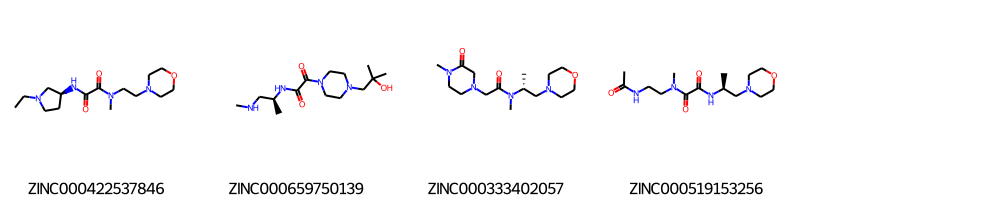

In [19]:
display_cluster_members(df,mols2grid.selection.keys(),True)

Shift return below to clear the selections in the grid

In [ ]:
mols2grid.reset_selection()

In [ ]:
from rdkit.Chem.Descriptors import BCUT2D_MWLOW